# Quickstart: NOAA GFS forecast - dynamical.org Icechunk Zarr
A brief introduction to the NOAA GFS forecast dataset transformed into an analysis-ready, cloud-optimized format by dynamical.org.

Dataset documentation: https://dynamical.org/catalog/noaa-gfs-forecast/

In [ ]:
# If running locally, follow README.md for simple dependency installation.
# If using Google Colab, run this cell.
!uv pip install dynamical-catalog

In [2]:
import dynamical_catalog

ds = dynamical_catalog.open("noaa-gfs-forecast", chunks=None)
ds

<xarray.Dataset> Size: 133TB
Dimensions:                                     (init_time: 7275,
                                                 lead_time: 209, latitude: 721,
                                                 longitude: 1440)
Coordinates:
  * init_time                                   (init_time) datetime64[ns] 58kB ...
    expected_forecast_length                    (init_time) timedelta64[ns] 58kB ...
    ingested_forecast_length                    (init_time) timedelta64[ns] 58kB ...
  * lead_time                                   (lead_time) timedelta64[ns] 2kB ...
    valid_time                                  (init_time, lead_time) datetime64[ns] 12MB ...
  * latitude                                    (latitude) float64 6kB 90.0 ....
  * longitude                                   (longitude) float64 12kB -180...
    spatial_ref                                 int64 8B ...
Data variables: (12/21)
    categorical_freezing_rain_surface           (init_time, lead_time, latitude, longitude) float32 6TB ...
    categorical_ice_pellets_surface             (init_time, lead_time, latitude, longitude) float32 6TB ...
    geopotential_height_cloud_ceiling           (init_time, lead_time, latitude, longitude) float32 6TB ...
    categorical_snow_surface                    (init_time, lead_time, latitude, longitude) float32 6TB ...
    downward_long_wave_radiation_flux_surface   (init_time, lead_time, latitude, longitude) float32 6TB ...
    categorical_rain_surface                    (init_time, lead_time, latitude, longitude) float32 6TB ...
    ...                                          ...
    temperature_2m                              (init_time, lead_time, latitude, longitude) float32 6TB ...
    wind_u_10m                                  (init_time, lead_time, latitude, longitude) float32 6TB ...
    wind_v_100m                                 (init_time, lead_time, latitude, longitude) float32 6TB ...
    total_cloud_cover_atmosphere                (init_time, lead_time, latitude, longitude) float32 6TB ...
    wind_v_10m                                  (init_time, lead_time, latitude, longitude) float32 6TB ...
    wind_u_100m                                 (init_time, lead_time, latitude, longitude) float32 6TB ...
Attributes:
    dataset_id:           noaa-gfs-forecast
    dataset_version:      0.2.7
    name:                 NOAA GFS forecast
    description:          Weather forecasts from the Global Forecast System (...
    attribution:          NOAA NWS NCEP GFS data processed by dynamical.org f...
    license:              CC-BY-4.0
    spatial_domain:       Global
    spatial_resolution:   0.25 degrees (~20km)
    time_domain:          Forecasts initialized 2021-05-01 00:00:00 UTC to Pr...
    time_resolution:      Forecasts initialized every 6 hours
    forecast_domain:      Forecast lead time 0-384 hours (0-16 days) ahead
    forecast_resolution:  Forecast step 0-120 hours: hourly, 123-384 hours: 3...

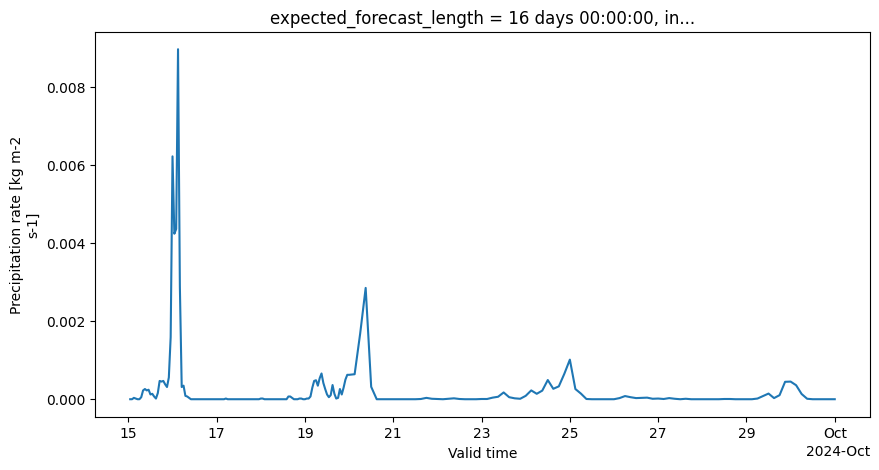

In [3]:
# Plot one precipitation forecast in Shanghai
plot_ds = ds.sel(init_time="2024-09-15T00", latitude=31.2, longitude=121.4, method="nearest")
_ = plot_ds["precipitation_surface"].plot(x="valid_time", figsize=(10, 5))

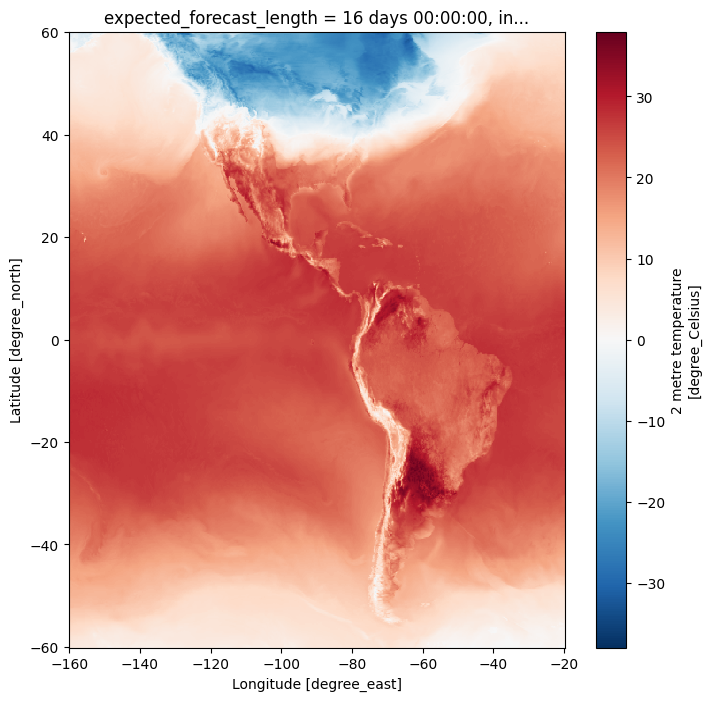

In [4]:
# 4 day ahead forecast of 2 meter air temperature from the 2025-02-01 00:00 UTC model initialization
(
    ds["temperature_2m"]
    .sel(init_time="2025-02-01T00", lead_time="4d")
    .sel(latitude=slice(60, -60), longitude=slice(-160, -20))
    .plot(figsize=(8, 8))
)

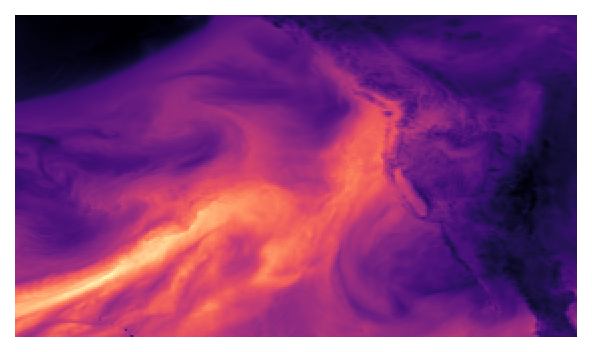

In [5]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

# An interactive animation of the February 2024 atmospheric river in the Pacific Ocean

data = (
    ds["precipitable_water_atmosphere"]
    .sel(
        init_time="2024-01-28T00",
        lead_time=slice("0h", "4d"),
        latitude=slice(60, 20),  
        longitude=slice(-170, -100), 
    ).load()
)

dpi=150
fig, ax = plt.subplots(figsize=(data.longitude.size/(dpi/2), data.latitude.size/(dpi/2)), dpi=dpi)
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ax.axis("off")

img = ax.imshow(data.isel(lead_time=0), cmap='magma')
anim = FuncAnimation(fig=fig, frames=data, func=lambda frame: img.set_data(frame), interval=80)

HTML(anim.to_jshtml())